In [1]:
from glob import glob
from astroquery.mast import Mast, Observations
import os
import shutil
import pyavm
import numpy as np
import PIL
import json
import requests
import asdf
import regions
from astropy import log
from astropy.io import ascii, fits
from astropy.wcs import WCS
from astropy import wcs
from astropy.coordinates import SkyCoord
from astropy.utils.data import download_file
from astropy.visualization import ImageNormalize, ManualInterval, LogStretch, LinearStretch
from astropy.visualization import simple_norm
import matplotlib.pyplot as plt
import matplotlib as mpl
from astropy.table import Table
from astropy.nddata import Cutout2D
import astropy.units as u

# do this before importing webb
#os.environ["CRDS_PATH"] = "/orange/adamginsburg/jwst/brick/crds/"
#os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"
#from jwst.datamodels import ImageModel

#from jwst.pipeline import calwebb_image3
#from jwst.pipeline import Detector1Pipeline, Image2Pipeline#

#from jwst.datamodels import ImageModel

#import jwst.datamodels
#from jwst import datamodels

In [2]:
basepath = '/orange/adamginsburg/jwst/cloudc/'

In [3]:
cd /orange/adamginsburg/jwst/cloudc/analysis/

/blue/adamginsburg/adamginsburg/jwst/cloudc/code/brick-jwst-2221/analysis


In [4]:
#%run selections.py
basetable = Table.read(f'{basepath}/catalogs/basic_merged_photometry_tables_merged_bgsub_blur.fits')


In [5]:
def get_cutout(filename, position, l, w):
    try: 
        hdu = fits.open(filename, ext='SCI')[0]
    except: 
        hdu = fits.open(filename)[0]
    data = hdu.data
    head = hdu.header

    #pixel_scale = head['PIXSCALE']*u.arcsec/u.pix
    ww = WCS(head)
    size = (l, w)
    #((l/pixel_scale).to(u.pix), (w/pixel_scale).to(u.pix))
    cutout = Cutout2D(data, position=position, size=size, wcs=ww)
    return cutout

def get_cutout_rgb(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F466_reproj_merged-fortricolor.fits'
    #filename_B = '/orange/adamginsburg/jwst/cloudc/images/F187_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    cutout_G = cutout_R.data + cutout_B.data
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=90)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

 
#crds_in = crds_ab[reg.contains(crds_ab, wcs=ww_1)]

# Bokeh

In [6]:
mas_405 = np.logical_or(np.array(basetable['qfit_f405n'])<0.4, np.isnan(np.array(basetable['mag_ab_f405n'])))
mas_410 = np.logical_or(np.array(basetable['qfit_f410m'])<0.4, np.isnan(np.array(basetable['mag_ab_f410m'])))
mask = np.logical_and(mas_405, mas_410)
mas_466 = np.logical_or(np.array(basetable['qfit_f466n'])<0.4, np.isnan(np.array(basetable['mag_ab_f466n'])))
mask = np.logical_and(mask, mas_466)
mas_187 = np.logical_or(np.array(basetable['qfit_f187n'])<0.4, np.isnan(np.array(basetable['mag_ab_f187n'])))
mask = np.logical_and(mask, mas_187)
mas_182 = np.logical_or(np.array(basetable['qfit_f182m'])<0.4, np.isnan(np.array(basetable['mag_ab_f182m'])))
mask = np.logical_and(mask, mas_182)
mas_212 = np.logical_or(np.array(basetable['qfit_f212n'])<0.4, np.isnan(np.array(basetable['mag_ab_f212n'])))
mask = np.logical_and(mask, mas_212)

In [7]:
tbl_use = basetable[mask]
crds_use = tbl_use['skycoord_ref']

In [8]:
position_hmsfr = SkyCoord('17:46:21.4695266413', '-28:35:38.2082071644', unit=(u.hourangle, u.deg))
l = 1*u.arcmin
w = 1*u.arcmin
rgb, ww = get_cutout_rgb(position_hmsfr, l, w)
reg_cloudc = regions.RectangleSkyRegion(center=position_hmsfr, width=w, height=l)
tbl_in = tbl_use[reg_cloudc.contains(crds_use, wcs=ww)]
crds_in = crds_use[reg_cloudc.contains(crds_use, wcs=ww)]

In [9]:
#color_x =  tbl_use['mag_ab_f182m'] - tbl_use['mag_ab_f212n']
#color_y1 = tbl_use['mag_ab_f212n'] - tbl_use['mag_ab_f410m']
#color_y2 = tbl_use['mag_ab_f410m'] - tbl_use['mag_ab_f466n']

In [10]:
datasource = {
'182-212': tbl_in['mag_ab_f182m'] - tbl_in['mag_ab_f212n'], #basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'],
'410-466': tbl_in['mag_ab_f410m'] - tbl_in['mag_ab_f466n'], #basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'],
'ra': tbl_in['skycoord_ref'].ra, #basetable['skycoord_ref'].ra,
'dec': tbl_in['skycoord_ref'].dec, #basetable['skycoord_ref'].dec,
'mag_ab_f466n': tbl_in['mag_ab_f466n'], #basetable['mag_ab_f466n'],
'mag_ab_f405n': tbl_in['mag_ab_f405n'],
'mag_ab_f212n': tbl_in['mag_ab_f212n'], #basetable['mag_ab_f212n'],
'mag_ab_f410,': tbl_in['mag_ab_f410m'],
'mag_ab_f187n': tbl_in['mag_ab_f187n'],
'mag_ab_f182m': tbl_in['mag_ab_f182m'],
'212-410': tbl_in['mag_ab_f212n'] - tbl_in['mag_ab_f410m'],
'405-410': tbl_in['mag_ab_f405n'] - tbl_in['mag_ab_f410m'],
'187-182': tbl_in['mag_ab_f187n'] - tbl_in['mag_ab_f182m'],
}
downsel = slice(None, None, 100)
#datasource = {k:v[downsel] for k,v in datasource.items()}

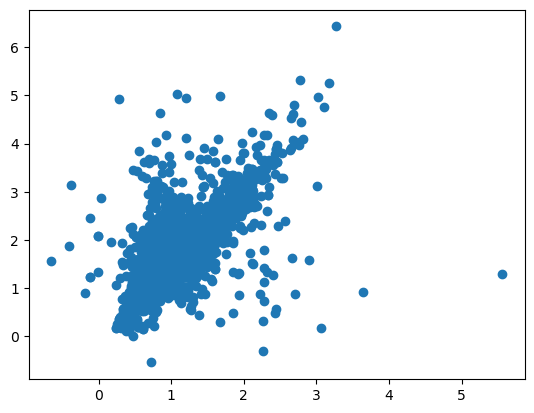

In [11]:
plt.scatter(tbl_in['mag_ab_f182m'] - tbl_in['mag_ab_f212n'], tbl_in['mag_ab_f212n'] - tbl_in['mag_ab_f410m'])

In [12]:
from bokeh.layouts import row, gridplot, layout, column
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.resources import INLINE
output_notebook(INLINE)
from bokeh.models import BooleanFilter, CDSView, ColumnDataSource

source = ColumnDataSource(datasource)
# create three plots with one renderer each
TOOLS = "box_select,lasso_select,pan,zoom_in,zoom_out,help"

# create three plots with one renderer each
TOOLS = "box_select,lasso_select,pan,zoom_in,zoom_out,help"

s4 = figure(tools=TOOLS, width=500, height=750)
s4.scatter('ra', 'dec', source=source)

s1 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa")
s1.scatter("182-212", "410-466", source=source,
           marker="circle", size=3, color="#53777a", alpha=0.8)

s2 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa",)
s2.scatter("405-410", "187-182", source=source, marker="triangle", size=3, color="#c02942", alpha=0.8)

s3 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa") #, y_axis_type="log",
s3.scatter("405-410", "mag_ab_f405n", source=source, marker="triangle", size=3, color="teal", alpha=0.8)

# put the results in a row and show
show(layout([[column(s4), column(s1,s2, s3)]]))

Loading BokehJS ...

/orange/adamginsburg/miniconda3/envs/python310/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [12]:
from bokeh.layouts import row, gridplot, layout, column
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.resources import INLINE
output_notebook(INLINE)
from bokeh.models import BooleanFilter, CDSView, ColumnDataSource

source = ColumnDataSource(datasource)
# create three plots with one renderer each
TOOLS = "box_select,lasso_select,pan,zoom_in,zoom_out,help"

# create three plots with one renderer each
TOOLS = "box_select,lasso_select,pan,zoom_in,zoom_out,help"

s4 = figure(tools=TOOLS, width=500, height=750)
s4.scatter('ra', 'dec', source=source)

s1 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa")
s1.scatter("182-212", "mag_ab_f182m", source=source,
           marker="circle", size=3, color="#53777a", alpha=0.8)

s2 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa",)
s2.scatter("405-410", "187-182", source=source, marker="triangle", size=3, color="#c02942", alpha=0.8)

s3 = figure(tools=TOOLS, width=500, height=250, background_fill_color="#fafafa") #, y_axis_type="log",
s3.scatter("405-410", "mag_ab_f405n", source=source, marker="triangle", size=3, color="teal", alpha=0.8)

# put the results in a row and show
show(layout([[column(s4), column(s1,s2, s3)]]))

Loading BokehJS ...

/orange/adamginsburg/miniconda3/envs/python310/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
